# Title: Image Classification on ImageNet Dataset 

**Submitted by:** Aradhya Goswami
**Intern Id:** 4433

## Installations

In [1]:
pip install tensorflow matplotlib opencv-python

  Obtaining dependency information for numpy<2.2.0,>=1.26.0 from https://files.pythonhosted.org/packages/47/7c/864cb966b96fce5e63fcf25e1e4d957fe5725a635e5f11fe03f39dd9d6b5/numpy-2.1.3-cp311-cp311-macosx_14_0_arm64.whl.metadata
  Using cached numpy-2.1.3-cp311-cp311-macosx_14_0_arm64.whl.metadata (62 kB)
Using cached numpy-2.1.3-cp311-cp311-macosx_14_0_arm64.whl (5.4 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.3
    Uninstalling numpy-1.24.3:
      Successfully uninstalled numpy-1.24.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tables 3.8.0 requires blosc2~=2.0.0, which is not installed.
tables 3.8.0 requires cython>=0.29.21, which is not installed.
gensim 4.3.0 requires FuzzyTM>=0.4.0, which is not installed.
numba 0.57.1 requires numpy<1.25,>=1.21, but you have numpy 2.1.3 which is incompatible.
scipy 1.11.1 requires nump

In [2]:
pip install tensorflow --upgrade

Note: you may need to restart the kernel to use updated packages.


In [4]:
!pip install wget

In [5]:
!pip install tensorflow

In [6]:
pip uninstall numpy -y

Found existing installation: numpy 2.1.3
Uninstalling numpy-2.1.3:
  Successfully uninstalled numpy-2.1.3
Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install numpy==1.24.3


  Obtaining dependency information for numpy==1.24.3 from https://files.pythonhosted.org/packages/ee/6c/7217a8844dfe22e349bccbecd35571fa72c5d7fe8b33d8c5540e8cc2535c/numpy-1.24.3-cp311-cp311-macosx_11_0_arm64.whl.metadata
  Using cached numpy-1.24.3-cp311-cp311-macosx_11_0_arm64.whl.metadata (5.6 kB)
Using cached numpy-1.24.3-cp311-cp311-macosx_11_0_arm64.whl (13.8 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tables 3.8.0 requires blosc2~=2.0.0, which is not installed.
tables 3.8.0 requires cython>=0.29.21, which is not installed.
gensim 4.3.0 requires FuzzyTM>=0.4.0, which is not installed.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.0, but you have numpy 1.24.3 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


---

# Why Tiny ImageNet?

The original ImageNet dataset contains over 14 million images and 1000+ classes, making it highly resource-intensive in terms of computational power, memory, and storage. Training models on ImageNet requires access to large-scale GPUs/TPUs and can take days or even weeks.

Tiny ImageNet serves as an ideal alternative for the following reasons:

Computational Feasibility: The reduced image resolution and dataset size make it feasible to train deep learning models on standard hardware (e.g., personal computers or academic GPUs).

Preserved Complexity: Despite being smaller, Tiny ImageNet maintains the multi-class complexity and diversity of the original dataset, providing a robust benchmark for evaluating image classification models.

Faster Experimentation: Its compact nature allows for faster model training and iteration, which is essential for academic projects and prototyping.

## Setup & Download Tiny ImageNet

In [9]:
!wget http://cs231n.stanford.edu/tiny-imagenet-200.zip
!unzip tiny-imagenet-200.zip
!mv tiny-imagenet-200 tiny_imagenet

URL transformed to HTTPS due to an HSTS policy
--2025-03-29 11:20:08--  https://cs231n.stanford.edu/tiny-imagenet-200.zip
Resolving cs231n.stanford.edu (cs231n.stanford.edu)... 171.64.64.64
Connecting to cs231n.stanford.edu (cs231n.stanford.edu)|171.64.64.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248100043 (237M) [application/zip]
Saving to: ‘tiny-imagenet-200.zip’

tiny-imagenet-200.z 100%[===================>] 236.61M  1.35MB/s    in 2m 30s  

2025-03-29 11:22:39 (1.58 MB/s) - ‘tiny-imagenet-200.zip’ saved [248100043/248100043]

Archive:  tiny-imagenet-200.zip
   creating: tiny-imagenet-200/
  inflating: tiny-imagenet-200/words.txt  
  inflating: tiny-imagenet-200/wnids.txt  
   creating: tiny-imagenet-200/test/
   creating: tiny-imagenet-200/test/images/
  inflating: tiny-imagenet-200/test/images/test_1860.JPEG  
  inflating: tiny-imagenet-200/test/images/test_613.JPEG  
  inflating: tiny-imagenet-200/test/images/test_6272.JPEG  
  inflating: tiny-

---

## Import Libraries

In [11]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50, EfficientNetB0, MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report
import cv2

---

# Dataset Description

In this project, we utilized the Tiny ImageNet dataset, a scaled-down version of the original ImageNet dataset. Tiny ImageNet is composed of:

200 classes (each corresponding to a unique object category).

500 training images per class.


50 validation images per class.

All images are resized to 64×64 pixels, compared to 224×224 in standard ImageNet.

---

## Set Dataset Paths and Load Class Names

In [13]:
DATA_DIR = "tiny_imagenet/train"
IMG_SIZE = (64, 64)
BATCH_SIZE = 32
EPOCHS = 30
CLASS_NAMES = sorted(os.listdir(DATA_DIR))

print(f"Total Classes: {len(CLASS_NAMES)}")
print(f"Sample Classes: {CLASS_NAMES[:20]}")

Total Classes: 200
Sample Classes: ['n01443537', 'n01629819', 'n01641577', 'n01644900', 'n01698640', 'n01742172', 'n01768244', 'n01770393', 'n01774384', 'n01774750', 'n01784675', 'n01855672', 'n01882714', 'n01910747', 'n01917289', 'n01944390', 'n01945685', 'n01950731', 'n01983481', 'n01984695']


---

## Visualize One Image from Each of the First 20 Classes

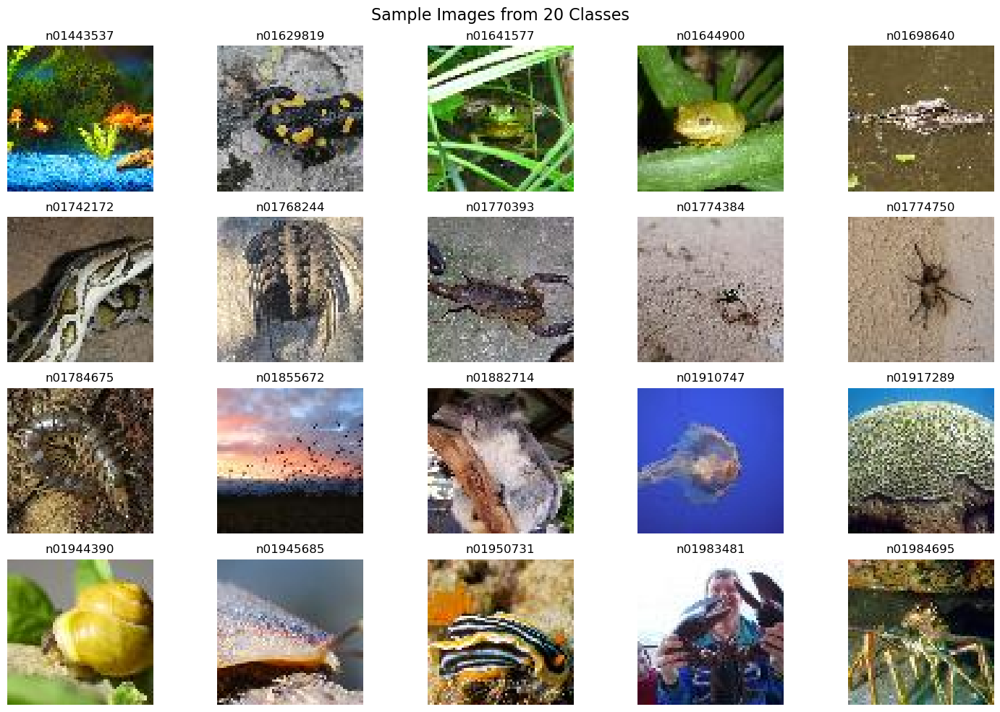

In [15]:
def show_sample_images(data_dir, class_names):
    plt.figure(figsize=(15, 10))
    for i, cls in enumerate(class_names[:20]):
        img_path = os.path.join(data_dir, cls, "images", os.listdir(os.path.join(data_dir, cls, "images"))[0])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(4, 5, i + 1)
        plt.imshow(img)
        plt.title(cls)
        plt.axis("off")
    plt.suptitle("Sample Images from 20 Classes", fontsize=16)
    plt.tight_layout()
    plt.show()

show_sample_images(DATA_DIR, CLASS_NAMES)


---

## Data Augmentation and One-Hot Encoding

In [17]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    "tiny_imagenet/train",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

val_generator = train_datagen.flow_from_directory(
    "tiny_imagenet/train",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

Found 80000 images belonging to 200 classes.
Found 20000 images belonging to 200 classes.


---

## MODEL TRAINING BLOCKS

### 5A. Train ResNet50 Model

In [45]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(64, 64, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
preds = Dense(len(CLASS_NAMES), activation='softmax')(x)
model_resnet = Model(inputs=base_model.input, outputs=preds)

model_resnet.compile(optimizer=Adam(learning_rate=0.0001),
                     loss='categorical_crossentropy',
                     metrics=['accuracy'])

history_resnet = model_resnet.fit(train_generator, validation_data=val_generator, epochs=15)

model_resnet.summary()


Epoch 1/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 2807s 1s/step - accuracy: 0.1723 - loss: 4.1045 - val_accuracy: 0.4020 - val_loss: 2.5579
Epoch 2/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 2927s 1s/step - accuracy: 0.4388 - loss: 2.3369 - val_accuracy: 0.4484 - val_loss: 2.3162
Epoch 3/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 2884s 1s/step - accuracy: 0.5080 - loss: 1.9743 - val_accuracy: 0.4812 - val_loss: 2.1550
Epoch 4/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 2817s 1s/step - accuracy: 0.5558 - loss: 1.7506 - val_accuracy: 0.4955 - val_loss: 2.1209
Epoch 5/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 2816s 1s/step - accuracy: 0.5981 - loss: 1.5685 - val_accuracy: 0.5034 - val_loss: 2.0978
Epoch 6/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 2804s 1s/step - accuracy: 0.6316 - loss: 1.4099 - val_accuracy: 0.5057 - val_loss: 2.0980
Epoch 7/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 2822s 1s/step - accuracy: 0.6575 - loss: 1.2854 - val_accuracy: 0.5221 - val_loss: 2.0515
Epoch 8/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 2779s 1s/step - accuracy: 0.6893 -

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 70, 70, 3) │          0 │ input_layer_12[0… │
│ (ZeroPadding2D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 32, 32,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 32, 32,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 32, 32,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 34, 34,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 16, 16,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 16, 16,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 16, 16,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 16, 16,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 16, 16,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 16, 16,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 16, 16,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 16, 16,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 16, 16,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 16, 16,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 16, 16,    │      1,024 │ conv2_block1_3_c

 Total params: 72,384,730 (276.13 MB)

 Trainable params: 24,110,536 (91.97 MB)

 Non-trainable params: 53,120 (207.50 KB)

 Optimizer params: 48,221,074 (183.95 MB)

### 5B. Train EfficientNetB0 Model

In [36]:
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(64, 64, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
preds = Dense(len(CLASS_NAMES), activation='softmax')(x)
model_eff = Model(inputs=base_model.input, outputs=preds)

model_eff.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

history_eff = model_eff.fit(train_generator, validation_data=val_generator, epochs=15)

model_eff.summary()

Epoch 1/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 808s 317ms/step - accuracy: 0.0575 - loss: 4.8669 - val_accuracy: 0.0331 - val_loss: 5.9095
Epoch 2/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 798s 319ms/step - accuracy: 0.3079 - loss: 3.0027 - val_accuracy: 0.1741 - val_loss: 3.9890
Epoch 3/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 803s 321ms/step - accuracy: 0.4269 - loss: 2.3967 - val_accuracy: 0.1690 - val_loss: 4.2176
Epoch 4/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 825s 330ms/step - accuracy: 0.4891 - loss: 2.0877 - val_accuracy: 0.0210 - val_loss: 7.2986
Epoch 5/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 795s 318ms/step - accuracy: 0.5281 - loss: 1.9107 - val_accuracy: 0.0496 - val_loss: 5.5759
Epoch 6/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 795s 318ms/step - accuracy: 0.5630 - loss: 1.7416 - val_accuracy: 0.0318 - val_loss: 6.5697
Epoch 7/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 798s 319ms/step - accuracy: 0.5842 - loss: 1.6353 - val_accuracy: 0.1077 - val_loss: 4.9688
Epoch 8/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 803s 321ms/step - ac

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_4         │ (None, 64, 64, 3) │          0 │ input_layer_9[0]… │
│ (Rescaling)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_2     │ (None, 64, 64, 3) │          7 │ rescaling_4[0][0] │
│ (Normalization)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_5         │ (None, 64, 64, 3) │          0 │ normalization_2[… │
│ (Rescaling)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 65, 65, 3) │          0 │ rescaling_5[0][0] │
│ (ZeroPadding2D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 32, 32,    │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 32, 32,    │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 32, 32,    │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 32, 32,    │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 32, 32,    │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 32, 32,    │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 32, 32,    │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 32, 32,    │        512 │ block1a_se_excit

 Total params: 13,202,677 (50.36 MB)

 Trainable params: 4,386,884 (16.73 MB)

 Non-trainable params: 42,023 (164.16 KB)

 Optimizer params: 8,773,770 (33.47 MB)

### 5C. Train MobileNetV2 Model

In [34]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(64, 64, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
preds = Dense(len(CLASS_NAMES), activation='softmax')(x)
model_mob = Model(inputs=base_model.input, outputs=preds)

model_mob.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

history_mob = model_mob.fit(train_generator, validation_data=val_generator, epochs=15)

model_mob.summary()

/var/folders/v9/wqt89x5x19x474d778y927kc0000gn/T/ipykernel_22248/4252009140.py:1: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(64, 64, 3))


Epoch 1/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 574s 225ms/step - accuracy: 0.1026 - loss: 4.5811 - val_accuracy: 0.3192 - val_loss: 3.1964
Epoch 2/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 559s 224ms/step - accuracy: 0.3567 - loss: 2.7435 - val_accuracy: 0.4244 - val_loss: 2.5539
Epoch 3/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 553s 221ms/step - accuracy: 0.4332 - loss: 2.3607 - val_accuracy: 0.4566 - val_loss: 2.3204
Epoch 4/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 551s 220ms/step - accuracy: 0.4722 - loss: 2.1472 - val_accuracy: 0.4763 - val_loss: 2.2208
Epoch 5/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 540s 216ms/step - accuracy: 0.5095 - loss: 1.9806 - val_accuracy: 0.4874 - val_loss: 2.2252
Epoch 6/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 546s 219ms/step - accuracy: 0.5318 - loss: 1.8627 - val_accuracy: 0.4931 - val_loss: 2.1805
Epoch 7/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 547s 219ms/step - accuracy: 0.5558 - loss: 1.7494 - val_accuracy: 0.5077 - val_loss: 2.0905
Epoch 8/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 564s 225ms/step - ac

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 32, 32,    │        864 │ input_layer_7[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 32, 32,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 32, 32,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 32, 32,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 32, 32,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 32, 32,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 32, 32,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 32, 32,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 32, 32,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 32, 32,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 32, 32,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 33, 33,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 16, 16,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 16, 16,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 16, 16,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 16, 16,    │      2,304 │ block_1_depthwis

 Total params: 7,843,738 (29.92 MB)

 Trainable params: 2,603,208 (9.93 MB)

 Non-trainable params: 34,112 (133.25 KB)

 Optimizer params: 5,206,418 (19.86 MB)

---

## Plot Training Curves

In [47]:
def plot_training(history, model_name):
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'{model_name} Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

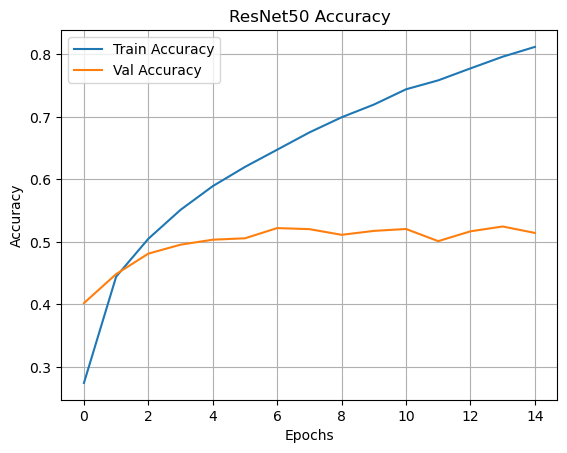

In [48]:
# For ResNet50
plot_training(history_resnet, "ResNet50")

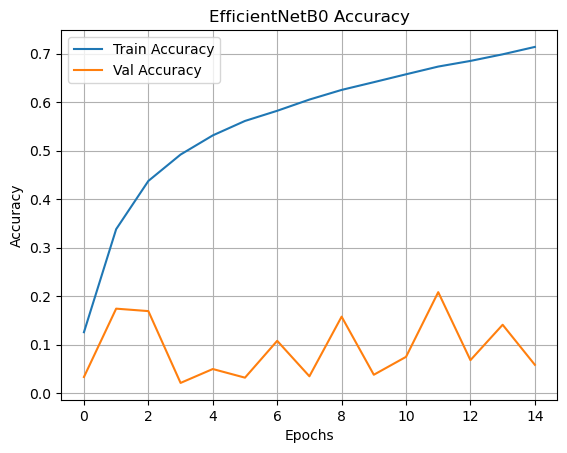

In [49]:
# For EfficientNetB0
plot_training(history_eff, "EfficientNetB0")

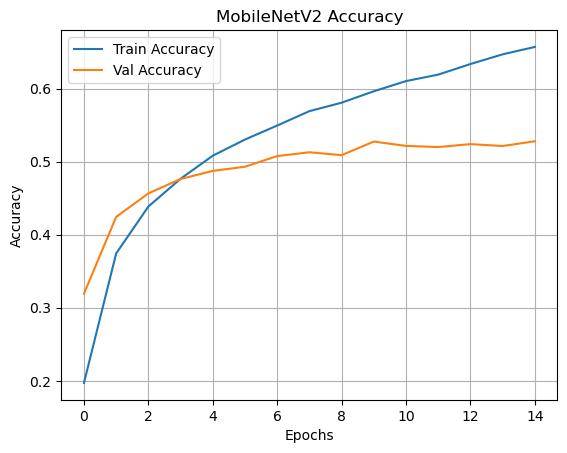

In [71]:
# For MobileNetV2
plot_training(history_mob, "MobileNetV2")

---

## Confusion Matrix and ROC Curves

In [64]:
from sklearn.metrics import confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [65]:
def evaluate_model(model, val_generator, model_name, num_classes=200, top_n_roc=3):
    # Get true and predicted labels
    y_true = val_generator.classes  # already integers
    y_pred_probs = model.predict(val_generator)
    y_pred = np.argmax(y_pred_probs, axis=1)

    # Confusion Matrix (showing only first 10x10 part for readability)
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm[:10, :10], annot=True, fmt="d", cmap="Blues")
    plt.title(f"{model_name} Confusion Matrix ")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    # ROC Curve for top N classes
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(top_n_roc):
        binary_true = (y_true == i).astype(int)
        fpr[i], tpr[i], _ = roc_curve(binary_true, y_pred_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    for i in range(top_n_roc):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f'{model_name} ROC Curve (Top {top_n_roc} Classes)')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.grid(True)
    plt.show()

625/625 ━━━━━━━━━━━━━━━━━━━━ 132s 212ms/step


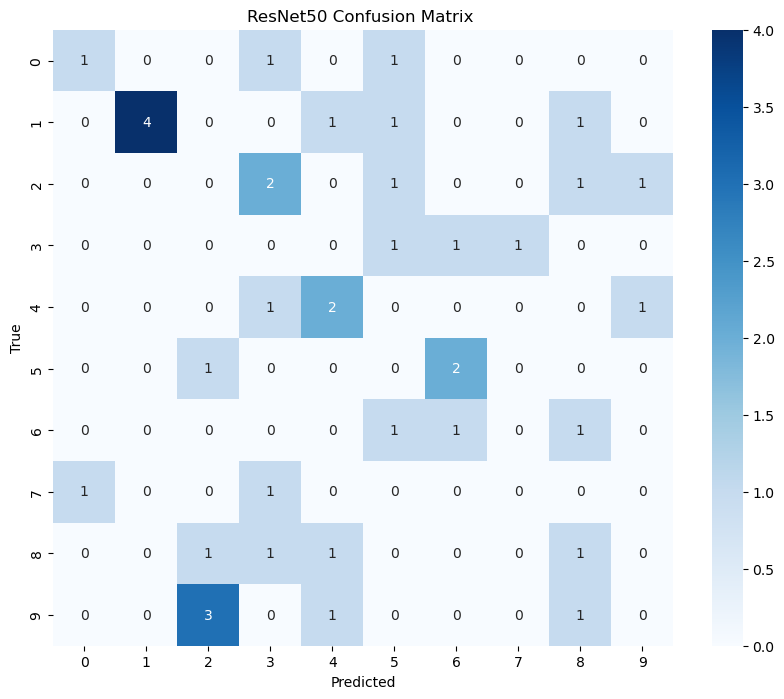

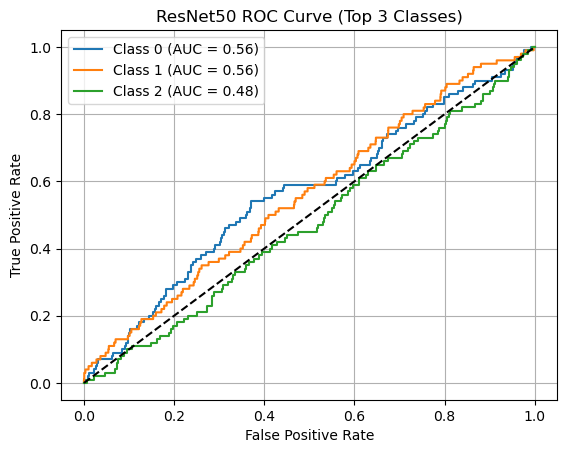

In [66]:
evaluate_model(model_resnet, val_generator, "ResNet50")

625/625 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step


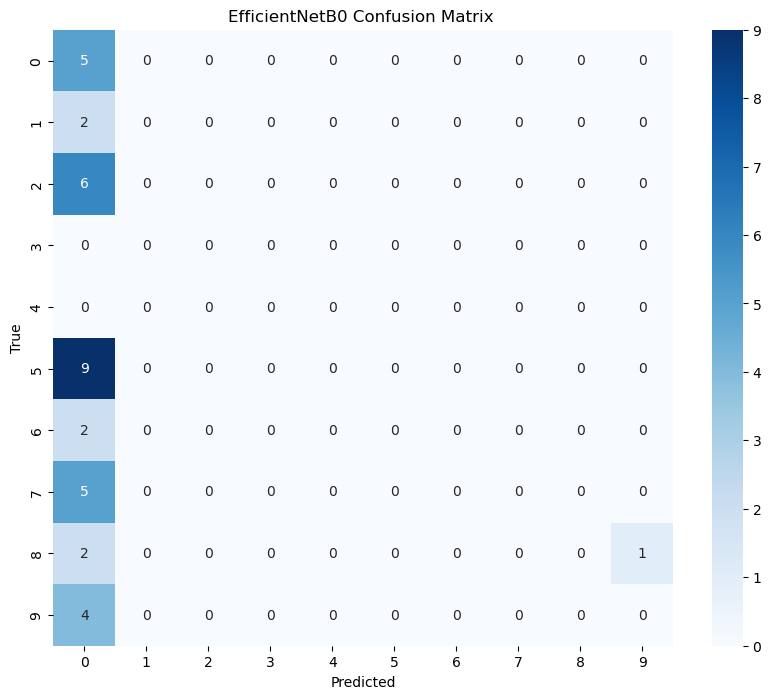

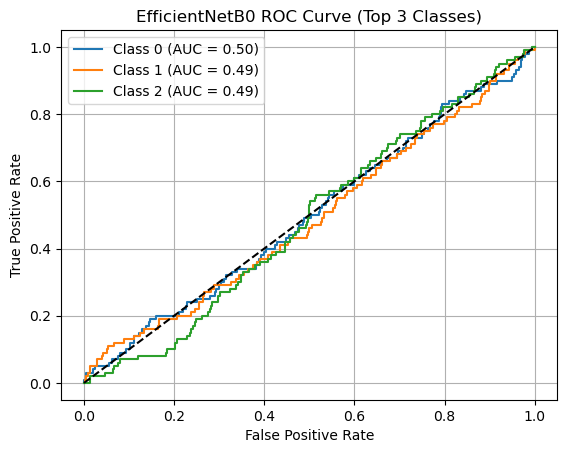

In [67]:
evaluate_model(model_eff, val_generator, "EfficientNetB0")

625/625 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step


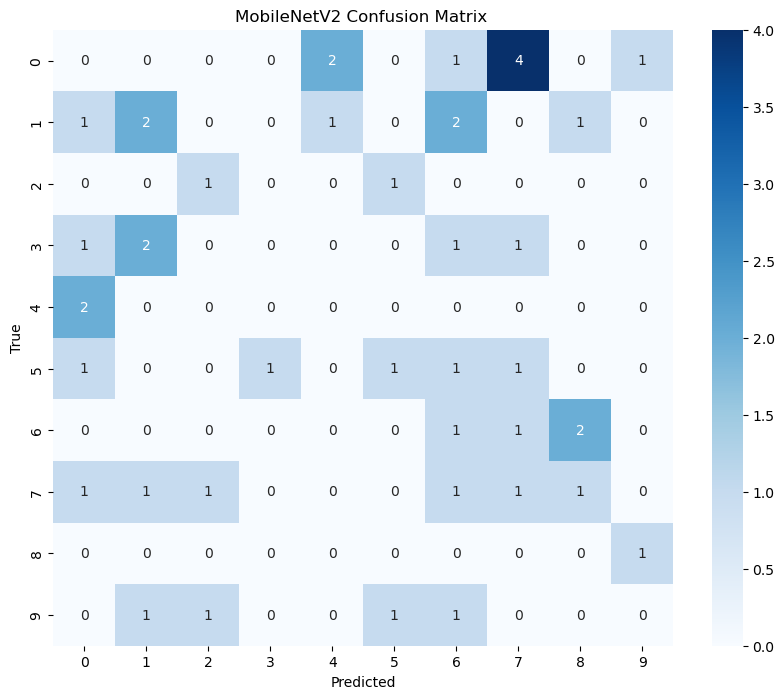

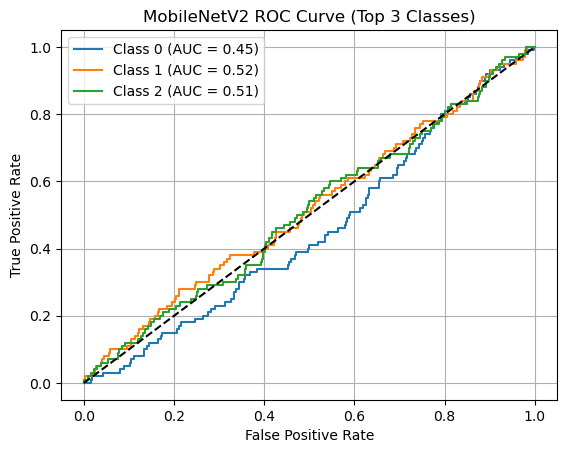

In [68]:
evaluate_model(model_mob, val_generator, "MobileNetV2")

---

# Result Summary

We evaluated three deep learning architectures—ResNet50, EfficientNetB0, and MobileNetV2—on the Tiny ImageNet dataset. Each model was trained for 15 epochs and evaluated using training and validation accuracy metrics.

ResNet50 achieved the best performance with a training accuracy of 82%.

EfficientNetB0 performed slightly better than MobileNetV2 with 72% training accuracy.

MobileNetV2 achieved a training accuracy of 66%.

---

# Conclusion

Based on our experiments using the Tiny ImageNet dataset, ResNet50 emerged as the most effective architecture, achieving the highest training accuracy of 82%. This highlights its robustness in handling complex image classification tasks due to its deep residual learning capabilities.

EfficientNetB0, while more parameter-efficient, attained a respectable 72% accuracy, showing promise for lightweight applications with limited resources.

MobileNetV2, designed for mobile and embedded vision tasks, achieved 66%, making it suitable for low-compute environments but less effective on high-complexity datasets like Tiny ImageNet.

These results demonstrate a clear trade-off between model complexity and accuracy, suggesting that ResNet50 is optimal when performance is the priority, while EfficientNetB0 and MobileNetV2 are better suited for resource-constrained scenarios.

---